In [1]:
import torch
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader, random_split,Dataset
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.datasets import VOCSegmentation
from PIL import Image
import os
import cv2

#iuo
import torch.nn.functional as F
from sklearn.metrics import jaccard_score

# Data load

In [2]:
class CustomDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.image_filenames = [f for f in os.listdir(image_dir) if f.endswith('.png')] #jpg or png etc.
        self.mask_filenames = [f for f in os.listdir(mask_dir) if f.endswith('.png')]
        

        assert len(self.image_filenames) == len(self.mask_filenames), "Image and mask counts do not match"

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.image_filenames[idx])
        mask_name = os.path.join(self.mask_dir, self.mask_filenames[idx])
        
        image = Image.open(img_name).convert('RGB')
        mask = Image.open(mask_name).convert('L')  # 'L' grayscale mask
        
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        
        return image, mask


# train test & visulaziton 

In [3]:
# Data converters
transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor()
])

# dataset
dataset = CustomDataset(image_dir='DataSet/images', mask_dir='DataSet/masks', transform=transform)
dataset = torch.utils.data.Subset(dataset, range(400))

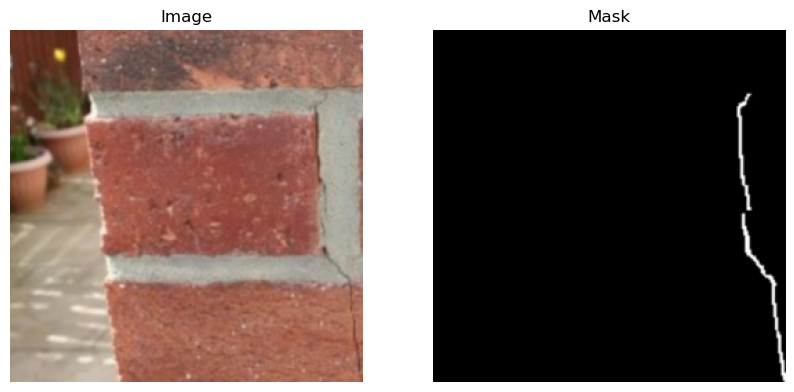

In [4]:
idx =50
image, mask = dataset[idx]

# Convert tensors back to numpy arrays
image = image.numpy().transpose(1, 2, 0)  # CHW to HWC
mask = mask.numpy().squeeze()             # Remove channel dimension

# Denormalize the image (assuming normalization was done)
image = image * 255.0
image = image.astype(np.uint8)

# Plot the image and mask
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(image)
axs[0].set_title('Image')
axs[0].axis('off')

axs[1].imshow(mask, cmap='gray')
axs[1].set_title('Mask')
axs[1].axis('off')

plt.show()

In [5]:
# Separate training and testing dataset
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False)


In [6]:
# Print dimensions of training and testing dataset
print(f'Total dataset size: {len(dataset)}')
print(f'Training dataset size: {len(train_dataset)}')
print(f'Test dataset size: {len(test_dataset)}')

# Print data sample count of data loaders
print(f'Training data loader total number of samples: {len(train_loader.dataset)}')
print(f'Test data loader total number of samples: {len(test_loader.dataset)}')

# Print batch number in training and test data loaders
print(f'Total batch number of training data loader: {len(train_loader)}')
print(f'Test data loader total batch number: {len(test_loader)}')

# Print a sample batch size (from the training data loader)
for images, masks in train_loader:
 print(f'Size of a training batch - Image: {images.size()}, Mask: {masks.size()}')
 break # check first batch only

Total dataset size: 400
Training dataset size: 320
Test dataset size: 80
Training data loader total number of samples: 320
Test data loader total number of samples: 80
Total batch number of training data loader: 160
Test data loader total batch number: 40
Size of a training batch - Image: torch.Size([2, 3, 256, 256]), Mask: torch.Size([2, 1, 256, 256])


In [7]:
import torch
from torch.utils.data import DataLoader, Subset
import numpy as np

# Get indexes of test dataset
test_indices = np.arange(len(test_dataset))

# Select 5 random indexes
random_indices = np.random.choice(test_indices, size=5, replace=False)

# Create subset
ran_test_subset = Subset(test_dataset, random_indices)

# Create DataLoader
ran_test_loader = DataLoader(ran_test_subset, batch_size=1, shuffle=False)

# Sample data output
for images, masks in ran_test_loader:
    print(f"Images batch shape: {images.shape}")
    print(f"Masks batch shape: {masks.shape}")
    break  # Show only the first example

Images batch shape: torch.Size([1, 3, 256, 256])
Masks batch shape: torch.Size([1, 1, 256, 256])


# criterion ve deeplab- modeli yükleme

In [8]:
from torchvision.models.segmentation import deeplabv3_resnet50

# Create the model and take it to training
model_deeplab = deeplabv3_resnet50(pretrained=True)
model_deeplab.classifier[4] = torch.nn.Conv2d(256, 1, kernel_size=1)  # Single channel (grayscale)

criterion= torch.nn.BCEWithLogitsLoss()  # Binary Cross-Entropy for binary segmentation
optimizer_deeplab = torch.optim.Adam(model_deeplab.parameters(), lr=1e-4)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_deeplab.to(device)


C:\Users\ilker\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ilker\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

# UnetPlusPlus 

In [9]:
from segmentation_models_pytorch import UnetPlusPlus

model_unetpp = UnetPlusPlus(encoder_name="resnet34", encoder_weights="imagenet", in_channels=3, classes=1)

optimizer_unetpp = torch.optim.Adam(model_unetpp.parameters(), lr=1e-4)
model_unetpp.to(device)


UnetPlusPlus(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tru

# Unet

In [10]:
from segmentation_models_pytorch import Unet

# Create the UNet model
model_unet = Unet(
    encoder_name="resnet34",       # Encoder type
    encoder_weights="imagenet",    # Encoder weights pre-trained with ImageNet
    in_channels=3,                 # Number of channels in the input image (e.g. 3 for RGB)
    classes=1                      # Number of output channels (1 for segmentation mask)
)
# Set the model to run on the device
model_unet = model_unet.to(device)

# Define the optimizer
optimizer_unet = torch.optim.Adam(model_unet.parameters(), lr=1e-4)

# UsquareNet

In [11]:
!git clone https://github.com/AuroraDuke/Net-Collection-Segmation

fatal: destination path 'Net-Collection-Segmation' already exists and is not an empty directory.


In [12]:
print(os.listdir('Net-Collection-Segmation'))
#print(os.listdir('U-2-Net/model'))
#with open('U-2-Net/model/u2net.py', 'r') as file:
   # print(file.read())

['.git', '.gitattributes', '.gitignore', 'keras', 'keras2', 'pytorch', 'README.md']


In [13]:
import sys
sys.path.append(os.path.join(os.getcwd(), 'Net-Collection-Segmation'))
from pytorch.u2net import U2NET # File containing the U2Net model
# Create the model and set it to run on the device
model_u2net = U2NET(3, 1)  # 3 channels RGB and 1 channel output
optimizer_u2net = torch.optim.Adam(model_u2net.parameters(), lr=1e-4)

model_u2net.to(device)

U2NET(
  (stage1): RSU7(
    (rebnconvin): REBNCONV(
      (conv_s1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (rebnconv1): REBNCONV(
      (conv_s1): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv2): REBNCONV(
      (conv_s1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv3): REBNCONV(
      (conv_s1): Conv2d(32, 32, k

# SegNet

In [14]:
from pytorch.segnet import SegNet

In [15]:
model_segnet = SegNet(input_nbr=3, label_nbr=1) #1 can be adjusted according to the number of classes
optimizer_segnet = torch.optim.Adam(model_segnet.parameters(), lr=1e-4)
model_segnet.to(device)

SegNet(
  (conv11): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn11): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv21): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn21): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv22): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn22): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv31): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn31): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv32): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn32): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, 

# IoU Metric

In [16]:
def iou_metric(pred, target, threshold=0.5):
    # Apply sigmoid to model outputs to get probabilities
    pred = torch.sigmoid(pred)
    
    # Apply threshold to get binary predictions
    pred = (pred > threshold).float()
    
    # Invert target if necessary (0 -> background, 1 -> object)
    target = 1 - target
    
    # Compute intersection and union
    intersection = (pred * target).sum()
    union = (pred + target).sum() - intersection
    
    if union == 0:
        return float('nan')  # Handle edge case when union is zero
    
    iou = intersection / (union + 1e-6)  # Adding epsilon to avoid division by zero
    return iou.item()

# Model save

In [17]:
# Create a folder called 'models', don't create it if it exists
os.makedirs('models', exist_ok=True)

# eğitme ve görüntüleme

In [18]:
def train_model(model, criterion, optimizer, train_loader, num_epochs=5, is_deeplab=False):
    model.train()
    print("Starting Net...")
    print(f'Epoch[ 0/{num_epochs}],')
    for epoch in range(num_epochs):
        running_loss = 0.0
        running_iou = 0.0
        for images, masks in train_loader:
            images = images.to(device)
            masks = masks.to(device)
            
            optimizer.zero_grad()
            
            outputs = model(images)
            
            if is_deeplab:
                outputs = outputs['out']
                
           # if isinstance(outputs, tuple):
              #  outputs = outputs[0]  # Adjust this if your model returns multiple outputs

            if isinstance(outputs, tuple):
                # Assuming the first output is the main prediction
                primary_output = outputs[0]
            else:
                primary_output = outputs
            
            loss = criterion(primary_output.squeeze(1), masks.squeeze(1))
            loss.backward()
            optimizer.step()

            # Calculate IoU for the batch
            iou = iou_metric(primary_output.squeeze(1), masks)
            running_iou += iou * images.size(0)
            running_loss += loss.item() * images.size(0)
            
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_iou = running_iou / len(train_loader.dataset)
        
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f},IoU: {epoch_iou:.4f}')

        # Define save path and save the model
    model_name = f'{model.__class__.__name__}.pth'
    save_path = os.path.join('models', model_name)
    
    # Save the model
    torch.save(model.state_dict(), save_path)
    print(f'Model saved to {save_path}')

In [19]:
import matplotlib.pyplot as plt

def visualize_results(model, test_loader, is_deeplab=False):
    model.eval()
    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = model(images)
            
            # If Deeplab model, get main output
            if is_deeplab:
                primary_output = outputs['out']
            else:
                primary_output = outputs
            
            # If outputs is a tuple, usually some of the model's output is the main output.
            #for U2Net
            if isinstance(primary_output, tuple):
                primary_output = primary_output[0]
            
            # Take appropriate action
            primary_output = torch.sigmoid(primary_output).squeeze(1)  # (B, 1, H, W) -> (B, H, W)
            masks = masks.squeeze(1)  # (B, 1, H, W) -> (B, H, W)
            
            # calculate IoU
            iou = iou_metric(primary_output, masks)
            print(f'IoU: {iou:.4f}')
            
            # Visualization
            for i in range(1):
                plt.figure(figsize=(15, 5))
                
                plt.subplot(1, 3, 1)
                plt.imshow(images[i].cpu().numpy().transpose(1, 2, 0))  # (B, C, H, W) -> (H, W, C)
                plt.title('Input Image')

                plt.subplot(1, 3, 2)
                plt.imshow(masks[i].cpu().numpy(), cmap='gray')  # (H, W)
                plt.title('Ground Truth')

                plt.subplot(1, 3, 3)
                plt.imshow(primary_output[i].cpu().numpy(), cmap='gray')  # (H, W)
                plt.title('Predicted Mask')

                plt.show()
                break


# Deeplab 

In [20]:
# Modeli eğit
train_model(model_deeplab, criterion, optimizer_deeplab, train_loader, num_epochs=5, is_deeplab=True)

Starting Net...
Epoch[ 0/5],
Epoch [1/5], Loss: 0.4127,IoU: 0.0910
Epoch [2/5], Loss: 0.1962,IoU: 0.0109
Epoch [3/5], Loss: 0.1379,IoU: 0.0083
Epoch [4/5], Loss: 0.1071,IoU: 0.0076
Epoch [5/5], Loss: 0.0888,IoU: 0.0083
Model saved to models\DeepLabV3.pth


IoU: 0.9841


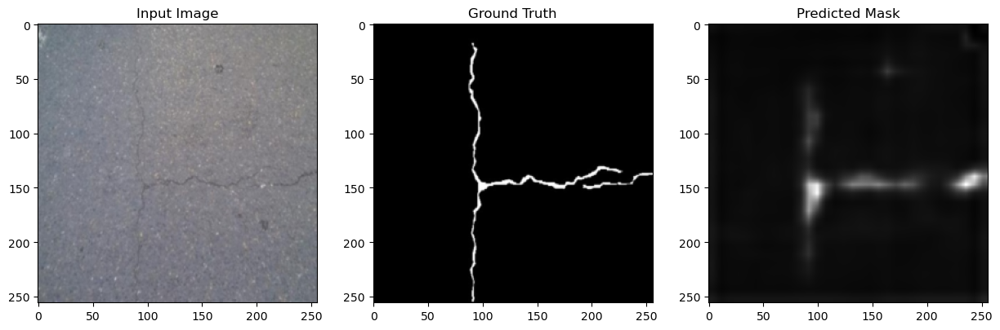

IoU: 0.0000


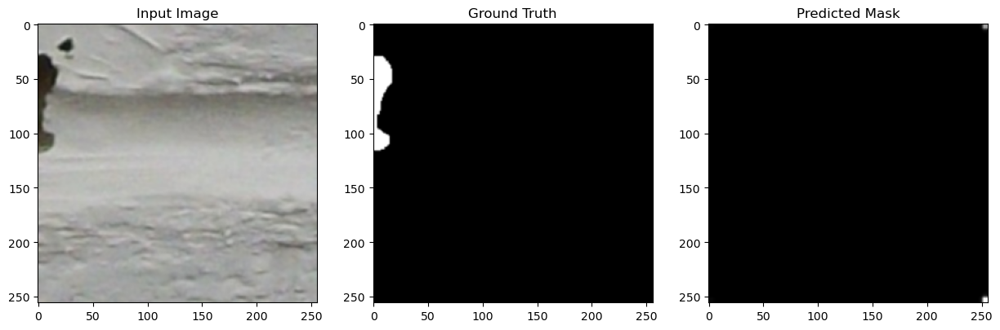

IoU: 0.9913


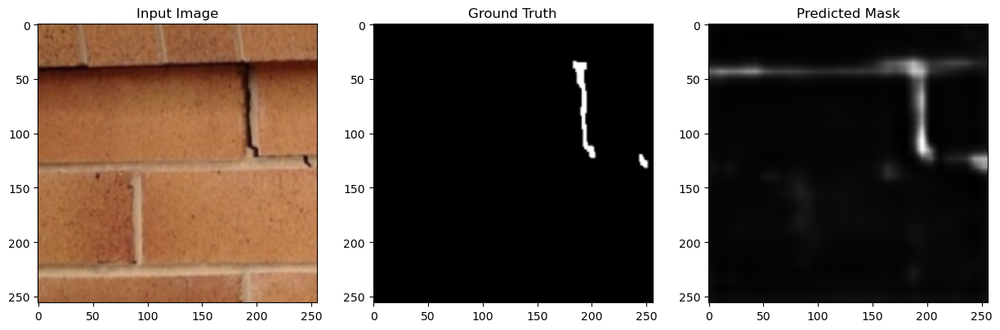

IoU: 0.9934


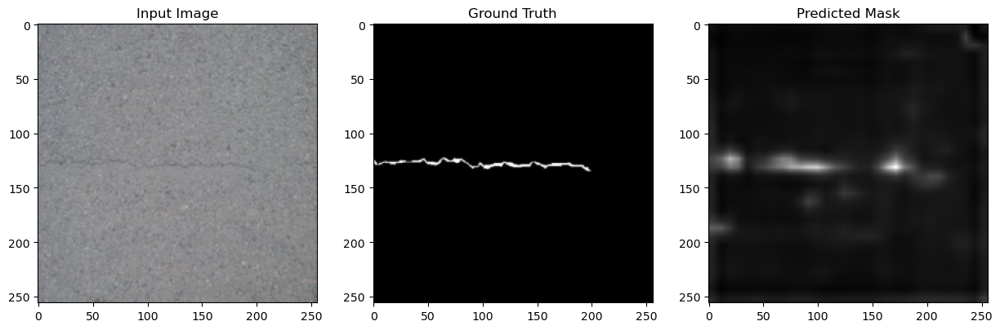

IoU: 0.9907


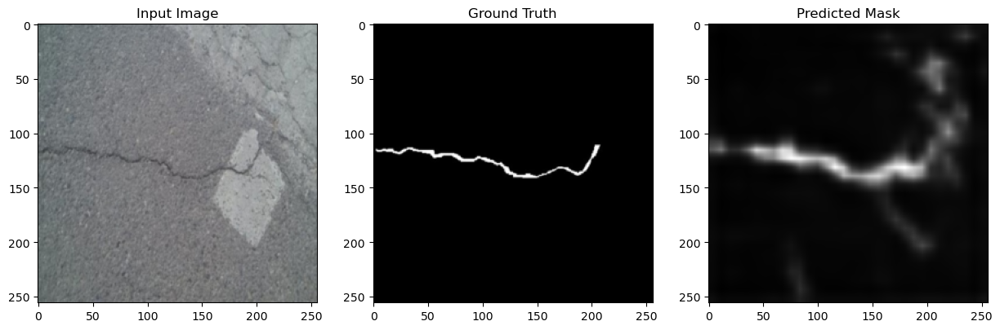

In [21]:
# Sonuçları görselleştir
visualize_results(model_deeplab, ran_test_loader,is_deeplab=True)

# unetpp 

In [22]:
train_model(model_unetpp, criterion, optimizer_unetpp, train_loader, num_epochs=5)

Starting Net...
Epoch[ 0/5],
Epoch [1/5], Loss: 0.5628,IoU: 0.1852
Epoch [2/5], Loss: 0.3032,IoU: 0.0107
Epoch [3/5], Loss: 0.2078,IoU: 0.0086
Epoch [4/5], Loss: 0.1561,IoU: 0.0079
Epoch [5/5], Loss: 0.1231,IoU: 0.0096
Model saved to models\UnetPlusPlus.pth


IoU: 0.9841


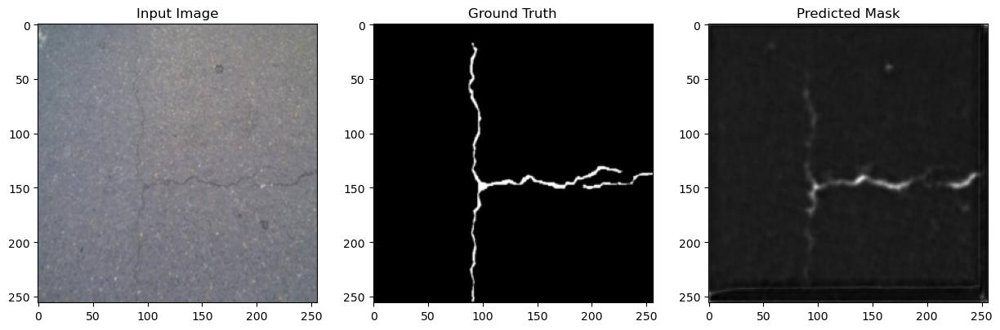

IoU: 0.9858


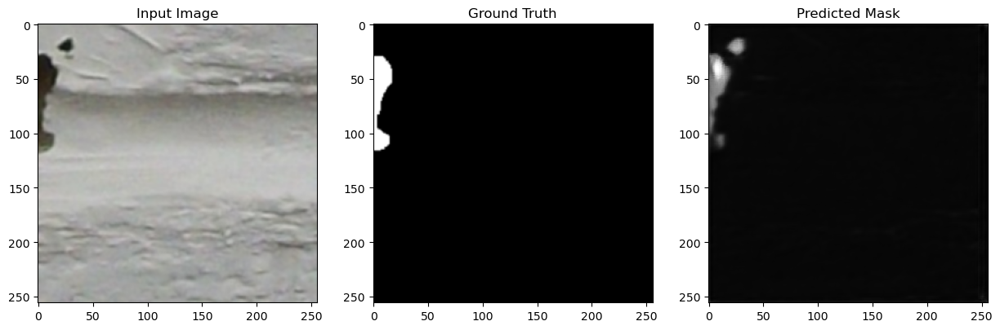

IoU: 0.9913


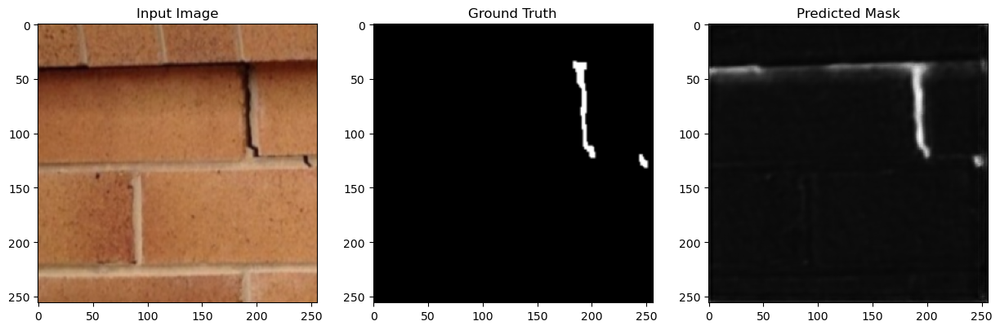

IoU: 0.9934


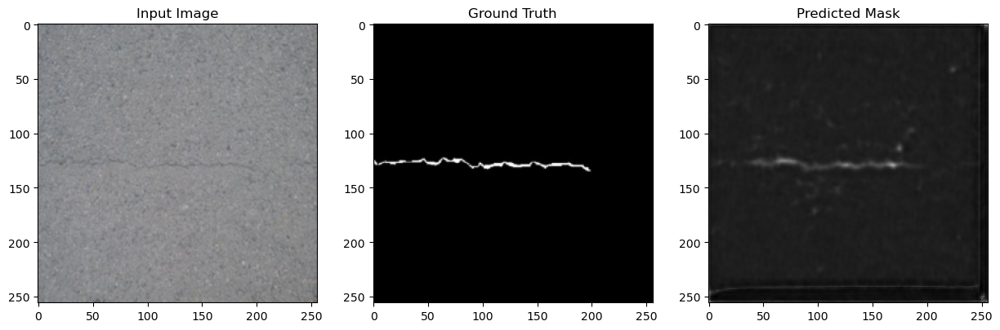

IoU: 0.9907


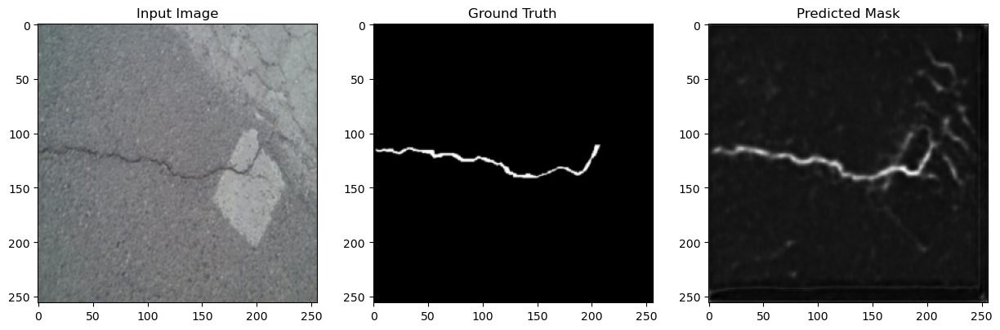

In [23]:
visualize_results(model_unetpp, ran_test_loader)

# Unet

In [24]:
train_model(model_unet, criterion, optimizer_unet, train_loader, num_epochs=5)

Starting Net...
Epoch[ 0/5],
Epoch [1/5], Loss: 0.3419,IoU: 0.0582
Epoch [2/5], Loss: 0.1644,IoU: 0.0124
Epoch [3/5], Loss: 0.1143,IoU: 0.0107
Epoch [4/5], Loss: 0.0900,IoU: 0.0117
Epoch [5/5], Loss: 0.0738,IoU: 0.0119
Model saved to models\Unet.pth


IoU: 0.9841


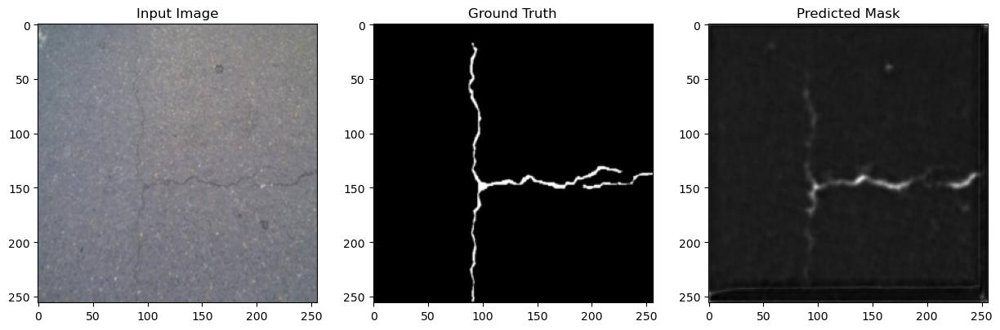

IoU: 0.9858


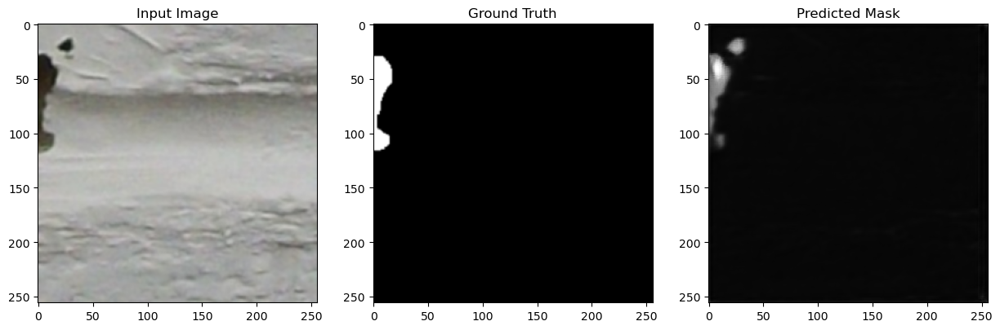

IoU: 0.9913


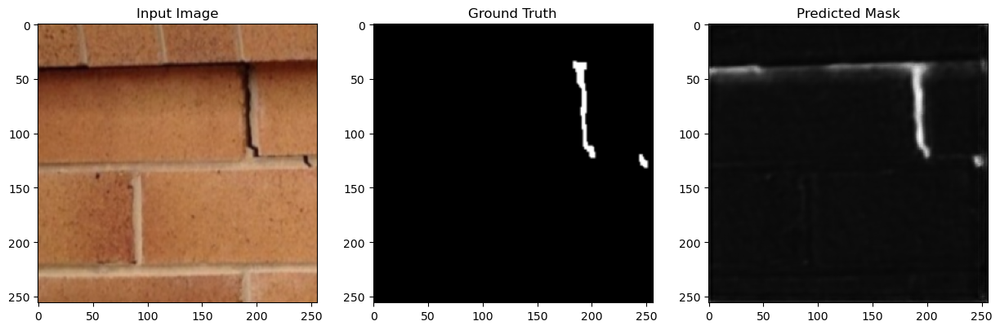

IoU: 0.9934


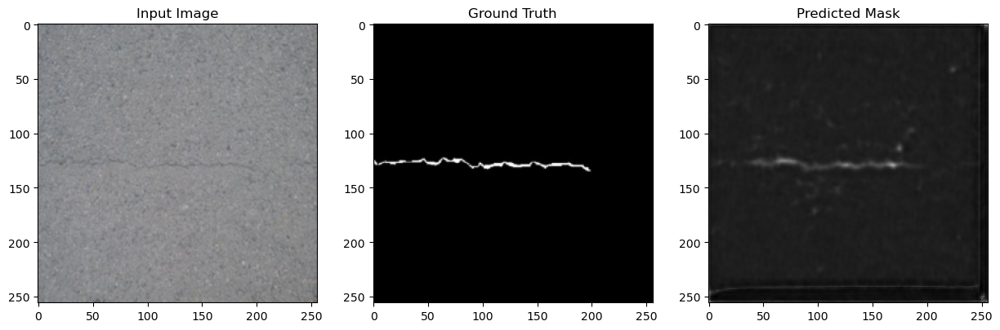

IoU: 0.9907


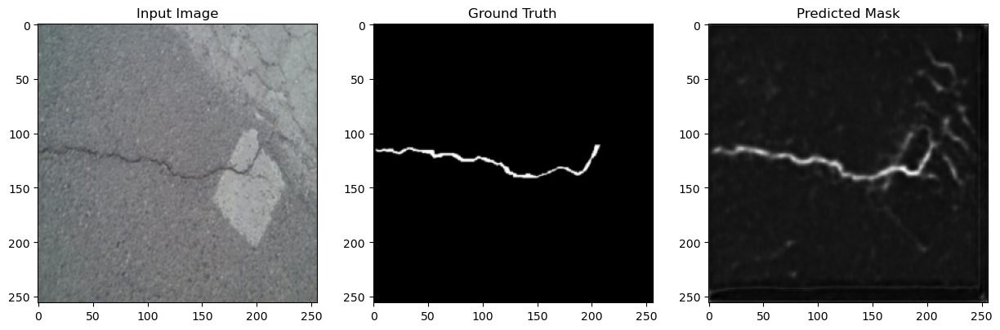

In [25]:
visualize_results(model_unetpp, ran_test_loader)

# UsquareNet

In [26]:
train_model(model_u2net, criterion, optimizer_u2net, train_loader, num_epochs=5)

Starting Net...
Epoch[ 0/5],


C:\Users\ilker\anaconda3\Lib\site-packages\torch\nn\functional.py:3809: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


Epoch [1/5], Loss: 0.6985,IoU: 0.9723
Epoch [2/5], Loss: 0.6922,IoU: 0.9722
Epoch [3/5], Loss: 0.6913,IoU: 0.9720
Epoch [4/5], Loss: 0.6908,IoU: 0.9714
Epoch [5/5], Loss: 0.6910,IoU: 0.9711
Model saved to models\U2NET.pth


IoU: 0.9841


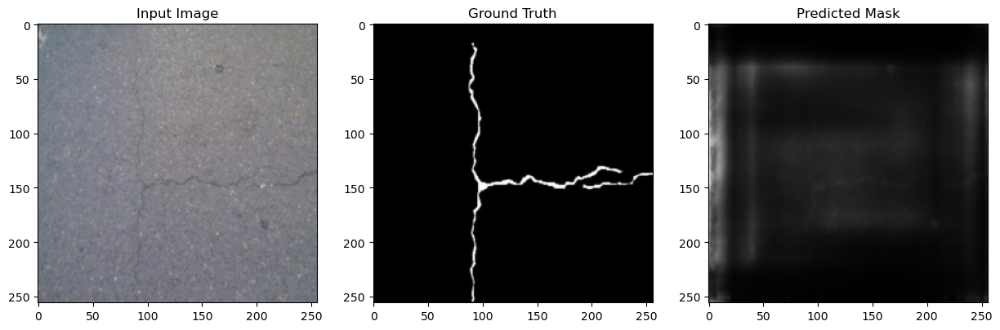

IoU: 0.9858


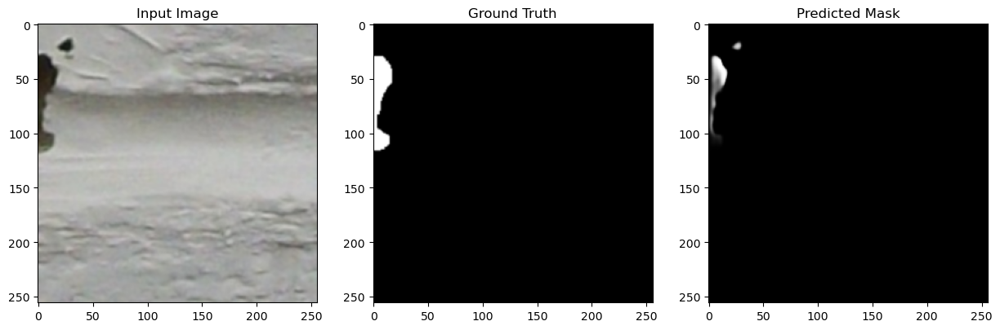

IoU: 0.9913


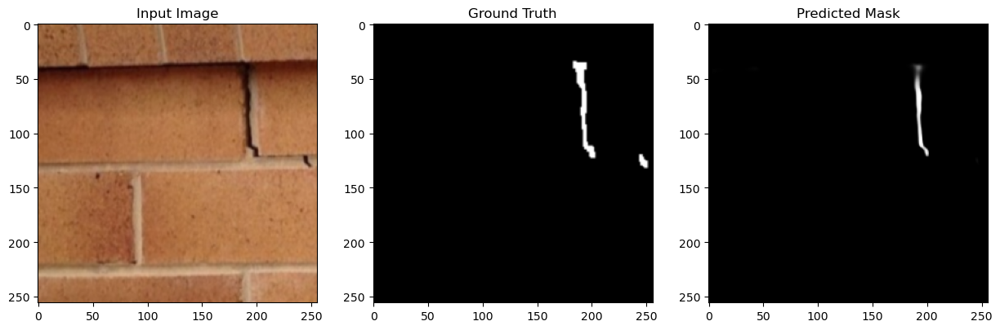

IoU: 0.9934


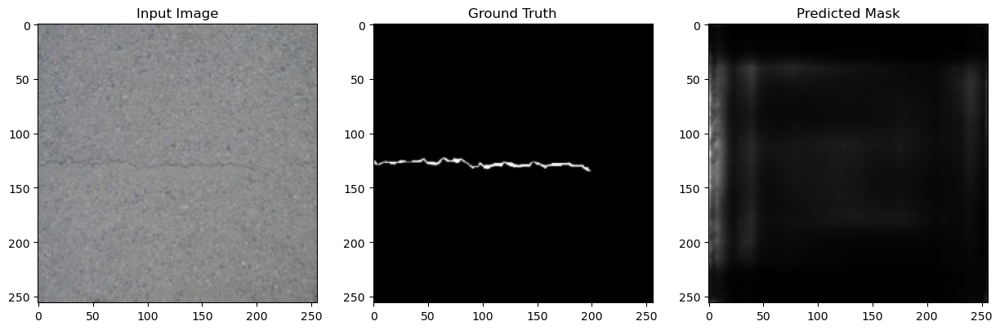

IoU: 0.9907


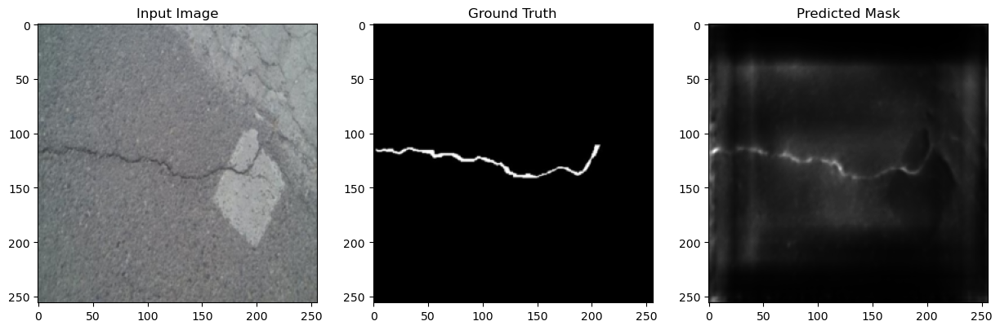

In [27]:
visualize_results(model_u2net, ran_test_loader)

# Segnet

In [28]:
train_model(model_segnet, criterion, optimizer_segnet, train_loader, num_epochs=5)

Starting Net...
Epoch[ 0/5],
Epoch [1/5], Loss: 0.2841,IoU: 0.0338
Epoch [2/5], Loss: 0.1016,IoU: 0.0082
Epoch [3/5], Loss: 0.0814,IoU: 0.0088
Epoch [4/5], Loss: 0.0783,IoU: 0.0085
Epoch [5/5], Loss: 0.0725,IoU: 0.0089
Model saved to models\SegNet.pth


IoU: 0.9413


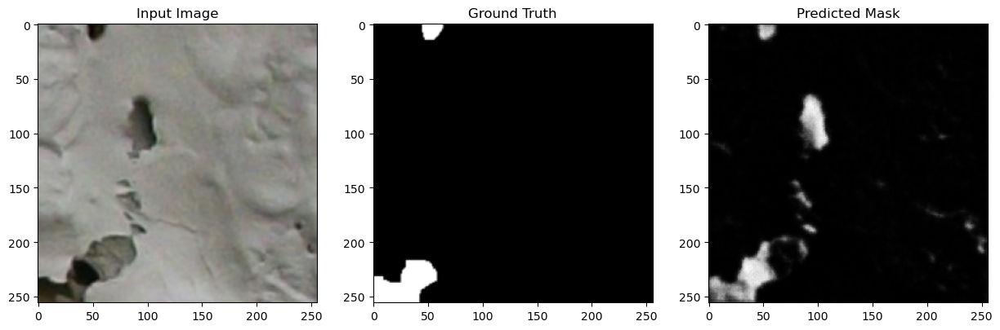

IoU: 0.9678


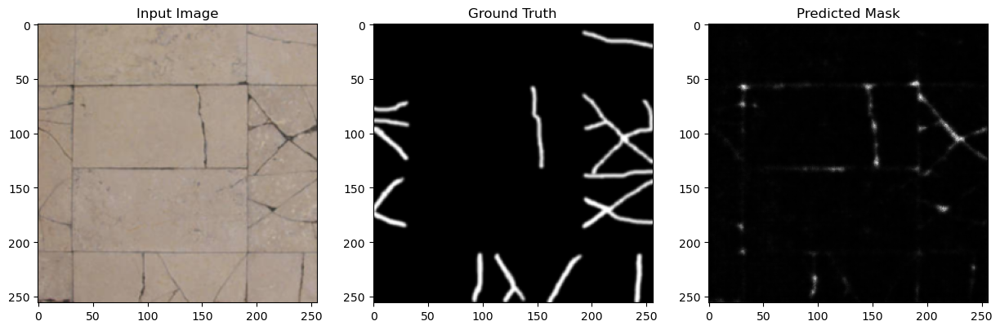

IoU: 0.9594


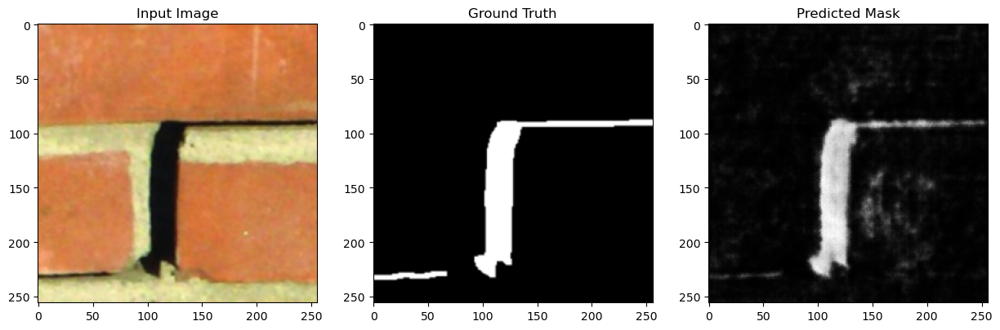

IoU: 0.9516


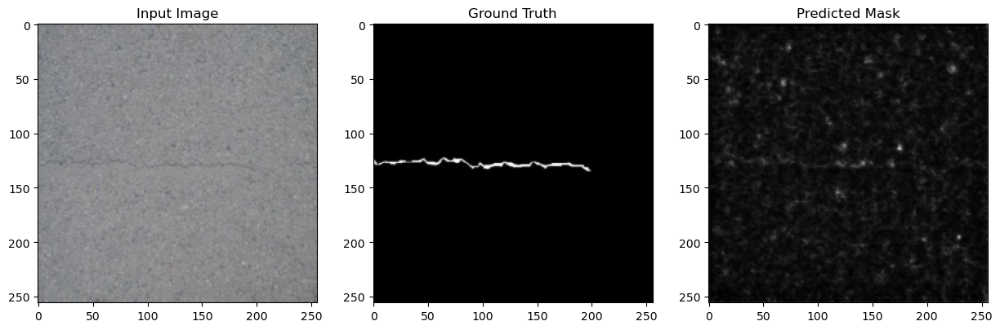

IoU: 0.9244


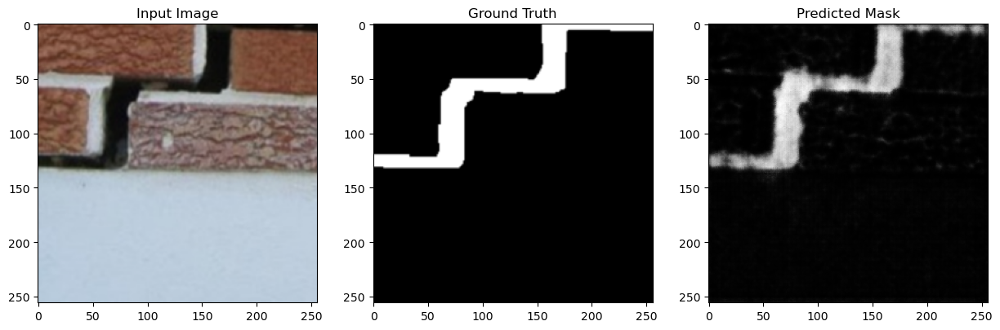

IoU: 0.9736


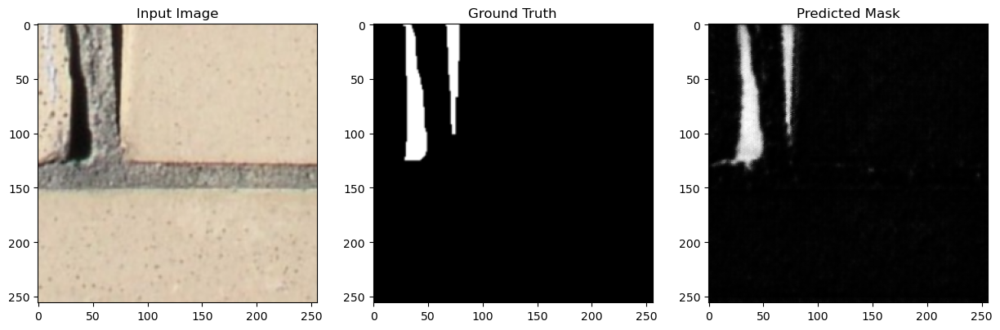

IoU: 0.9837


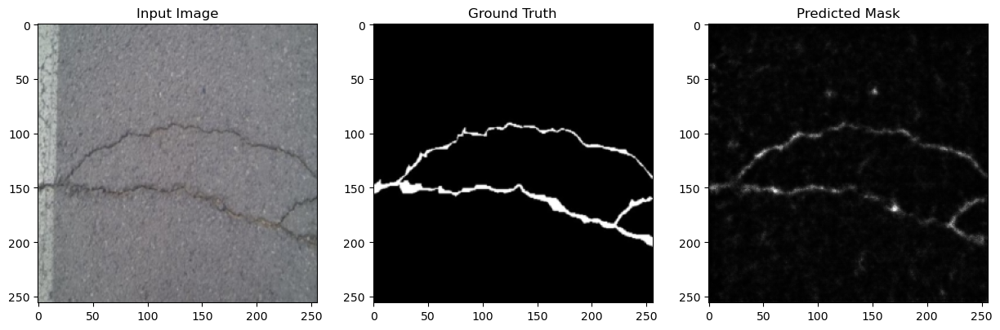

IoU: 0.9900


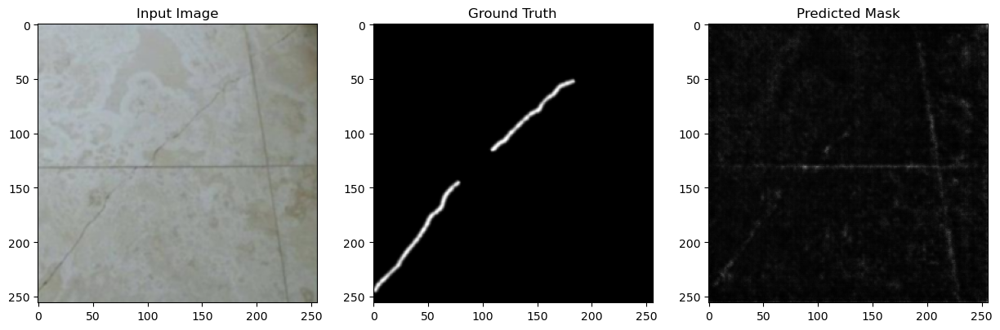

IoU: 0.9783


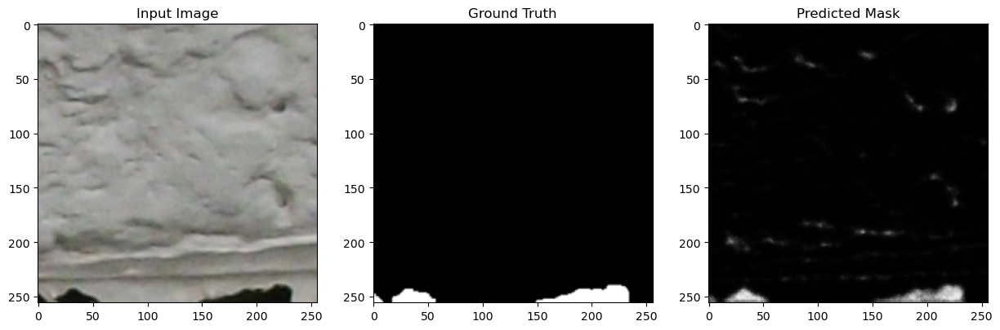

IoU: 0.9782


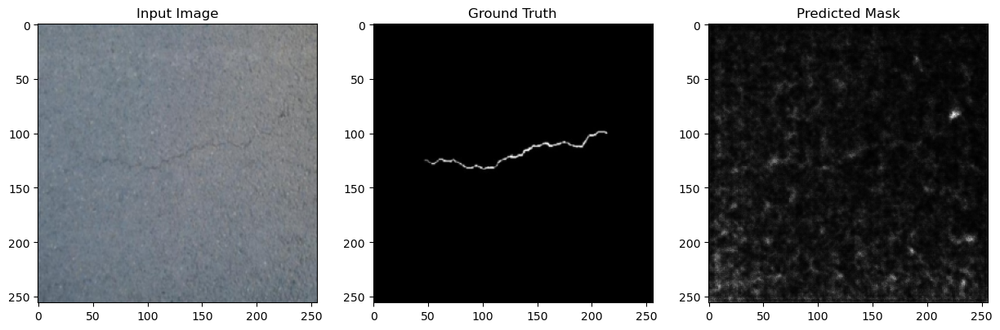

IoU: 0.9858


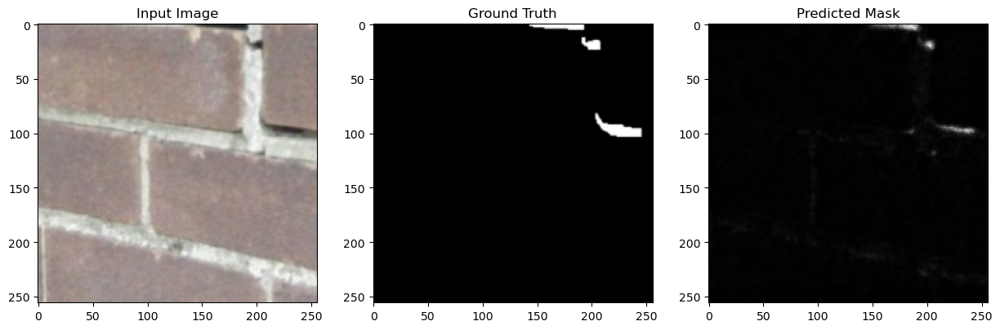

IoU: 0.9346


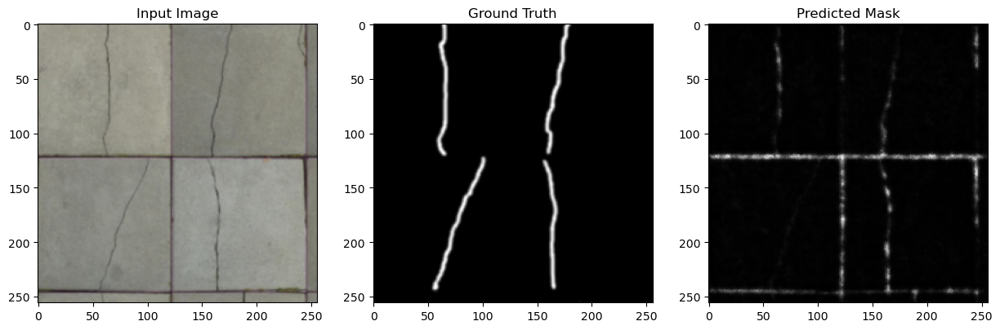

IoU: 0.9739


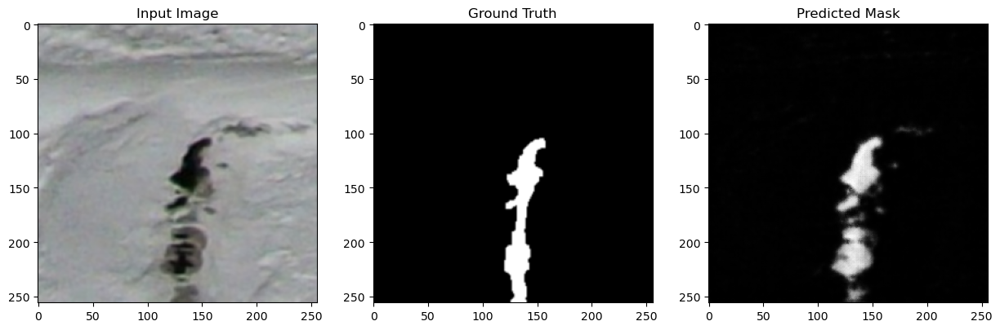

IoU: 0.9767


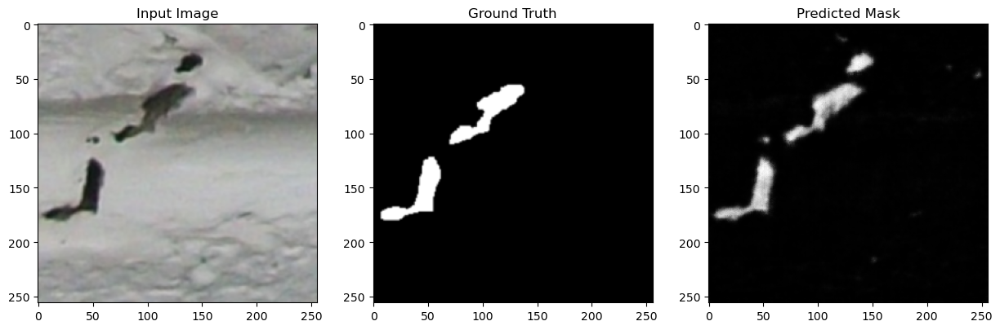

IoU: 0.9712


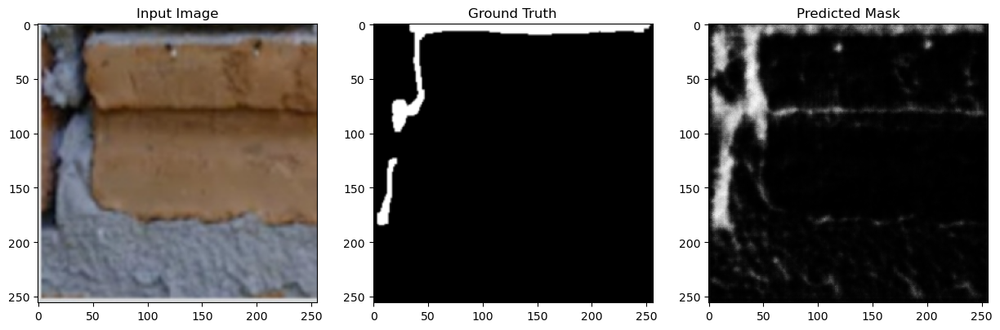

IoU: 0.9855


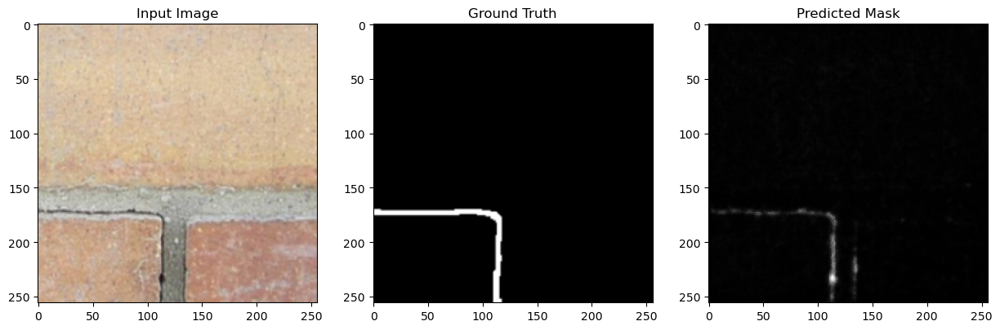

IoU: 0.9051


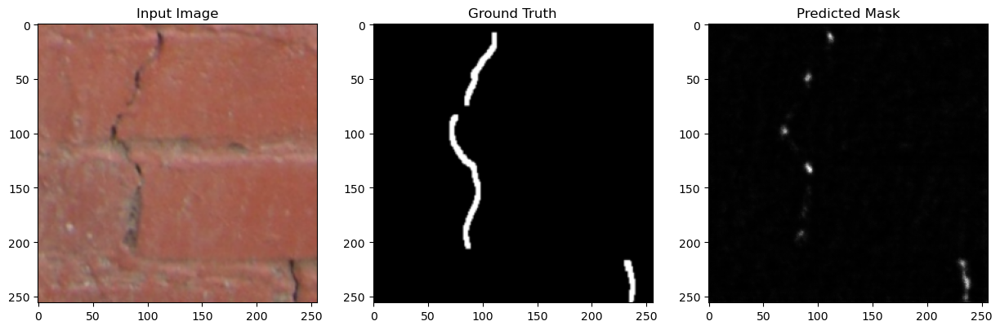

IoU: 0.9454


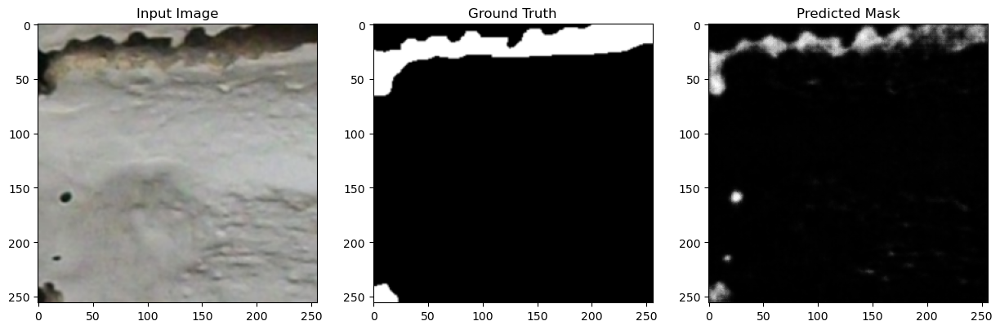

IoU: 0.9829


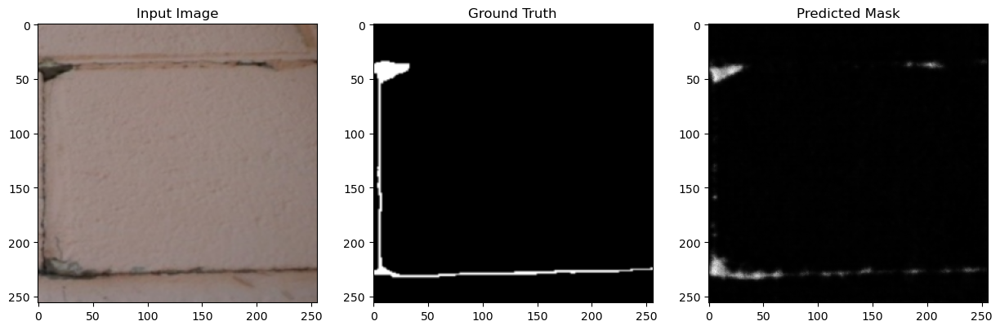

IoU: 0.9616


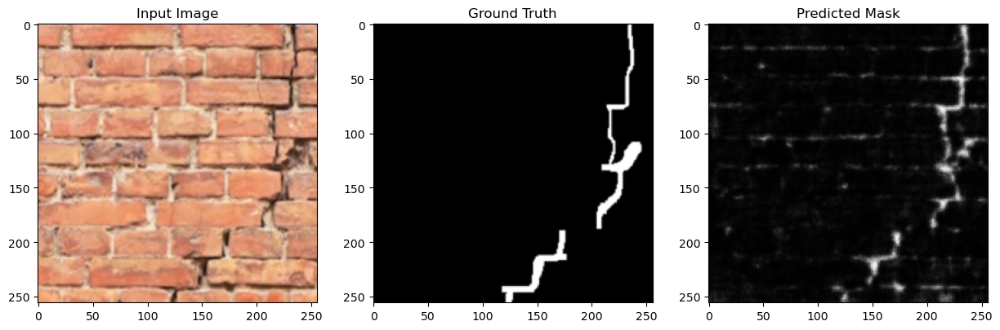

IoU: 0.9819


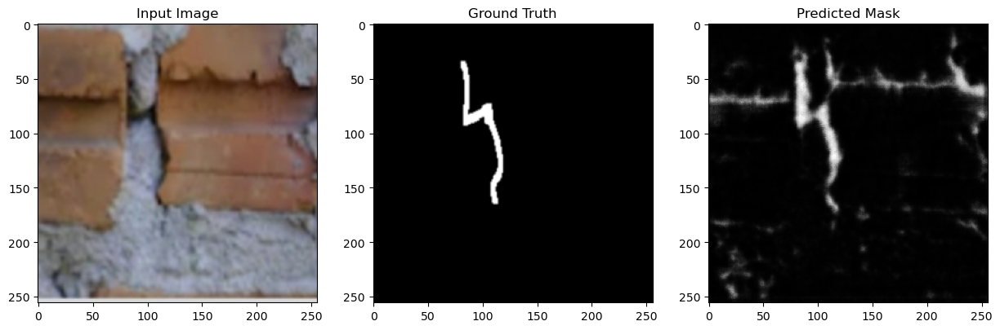

IoU: 0.9919


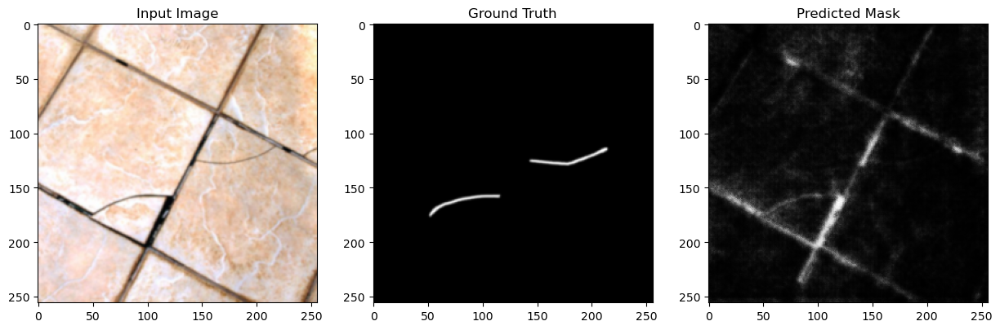

IoU: 0.9857


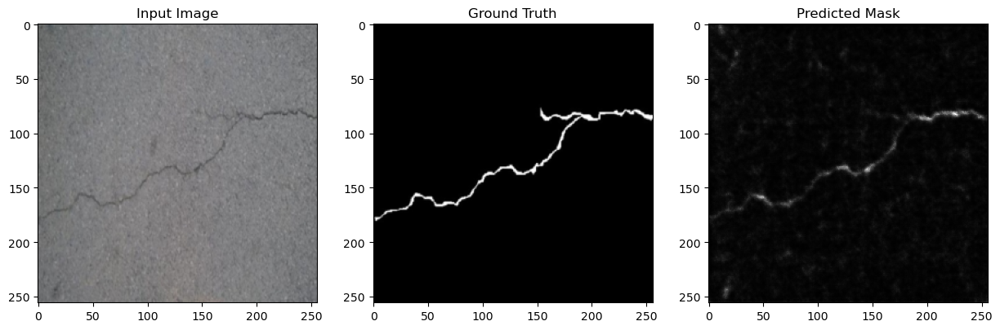

IoU: 0.9418


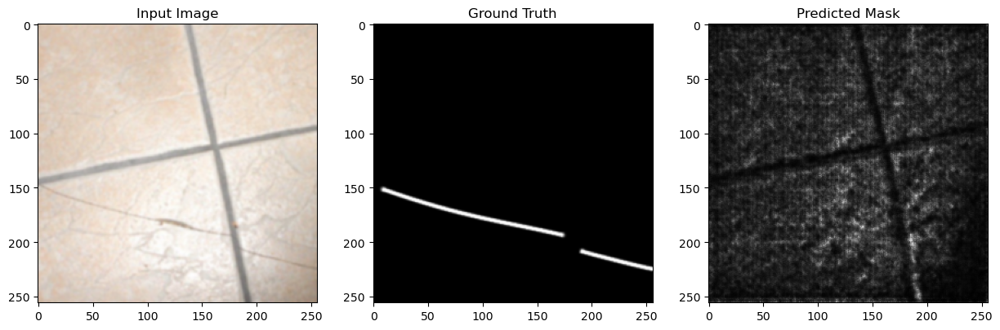

IoU: 0.9630


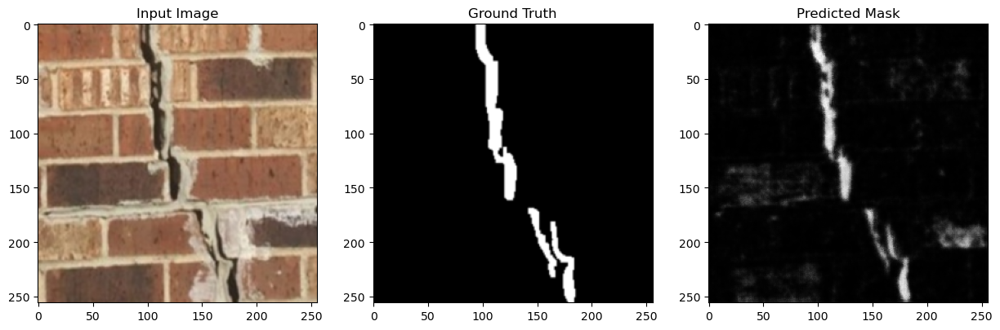

IoU: 0.9851


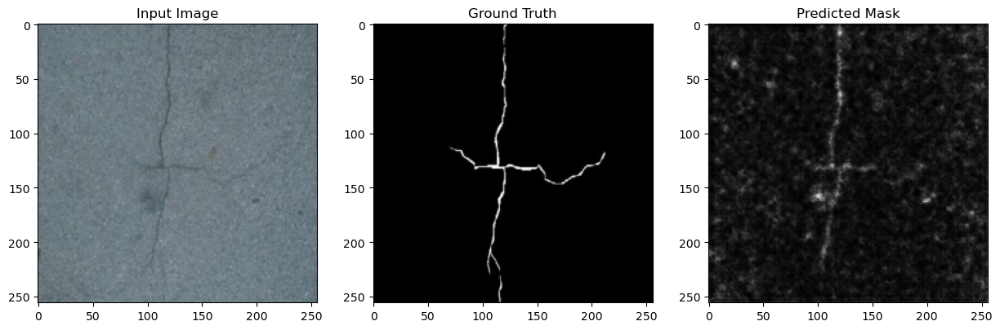

IoU: 0.9876


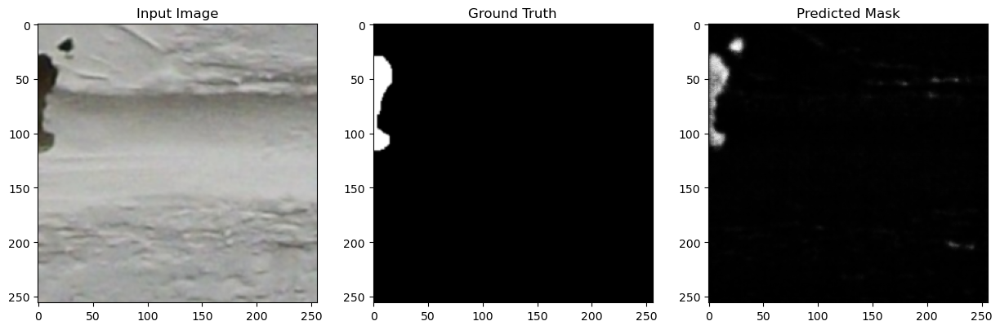

IoU: 0.9768


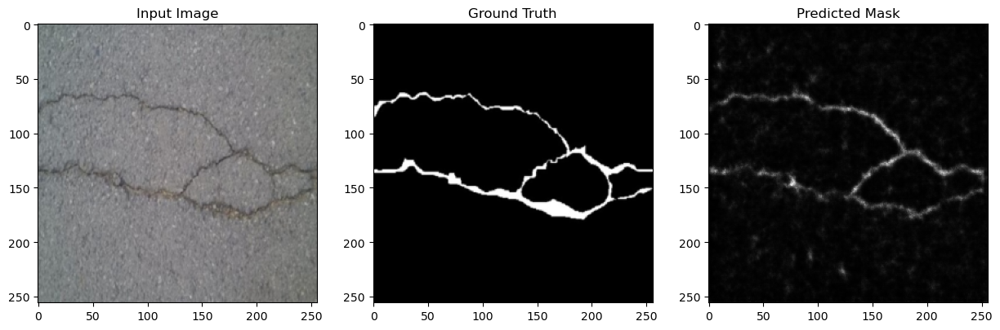

IoU: 0.9908


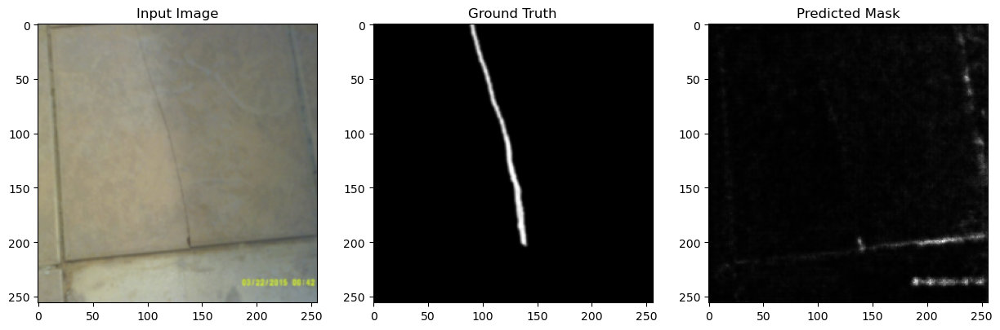

IoU: 0.9465


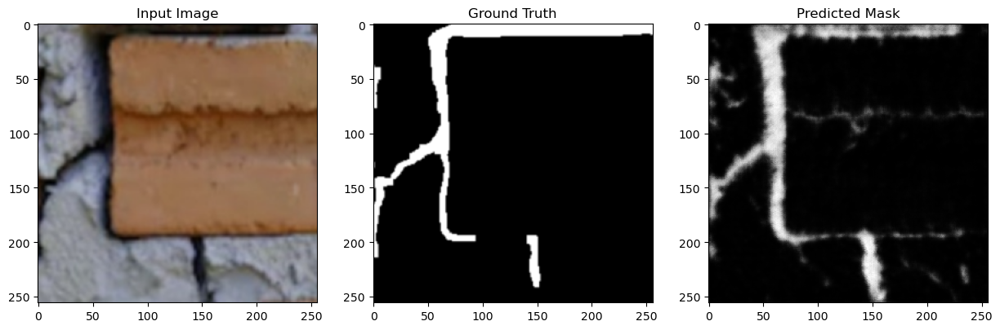

IoU: 0.9779


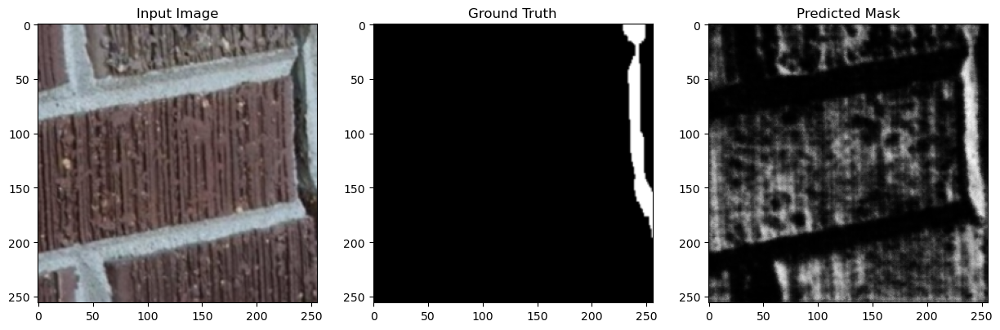

IoU: 0.9784


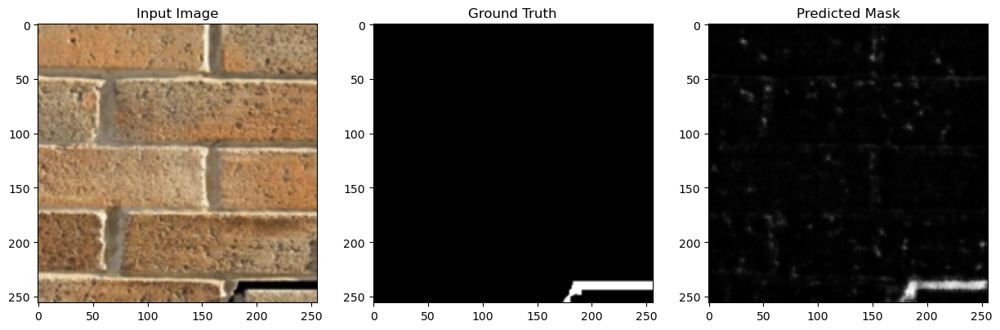

IoU: 0.9849


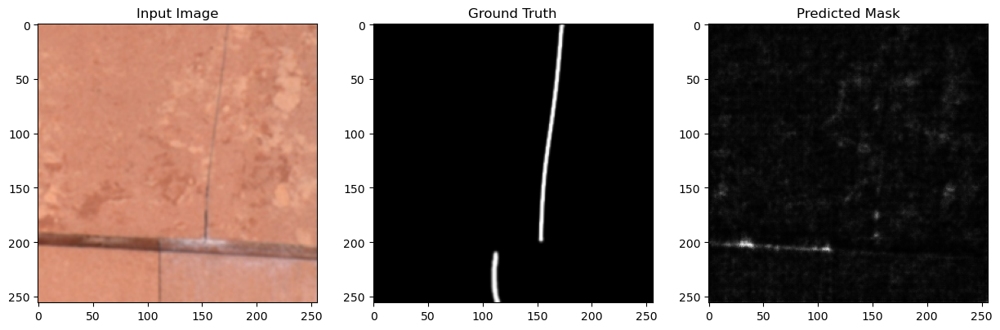

IoU: 0.9491


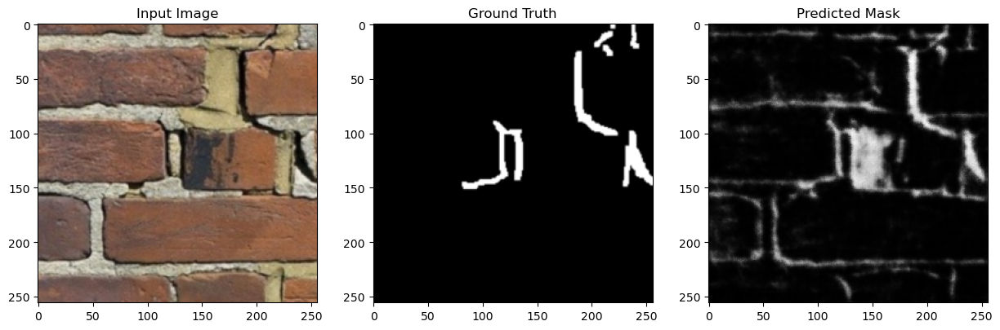

IoU: 0.9893


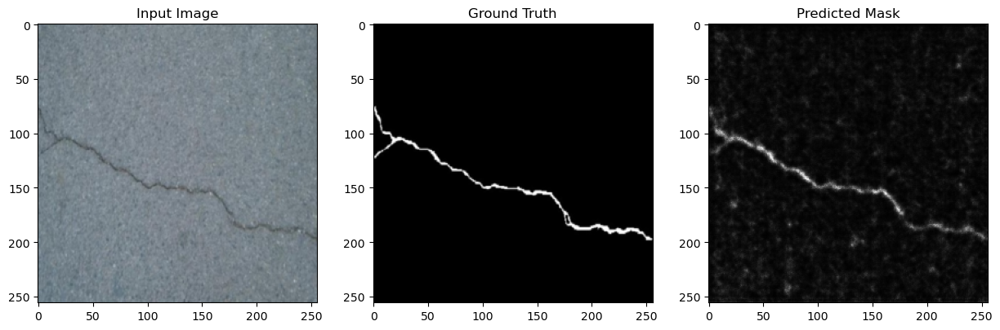

IoU: 0.9725


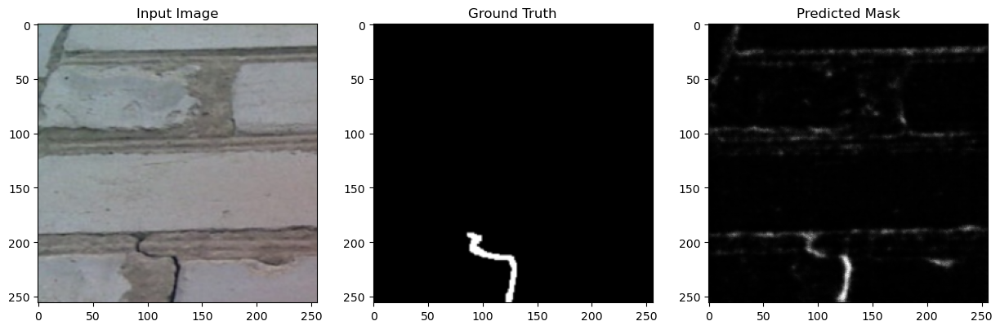

IoU: 0.9763


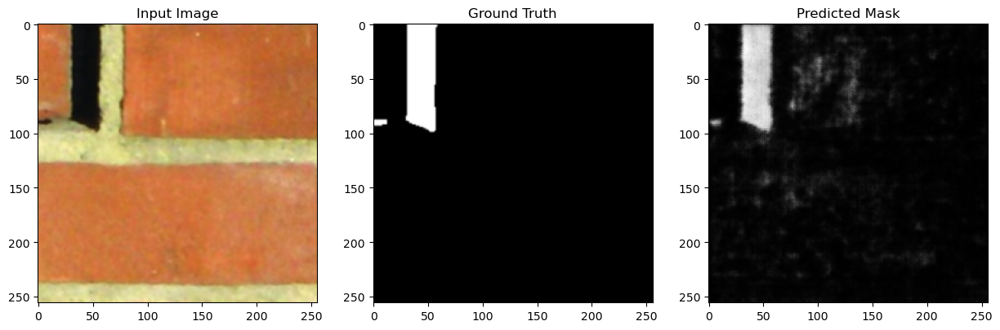

IoU: 0.9787


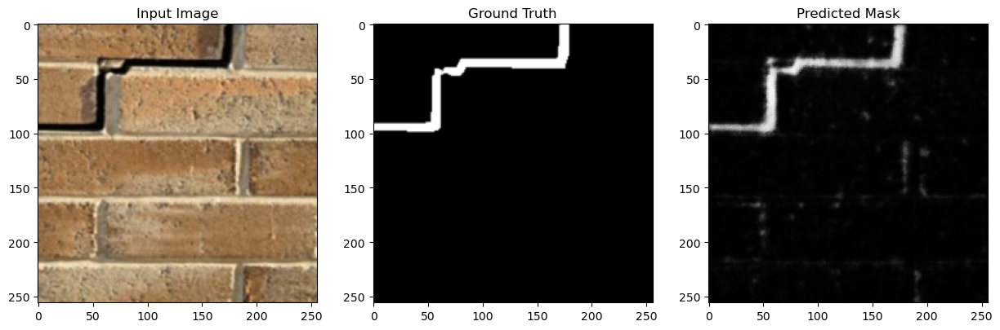

IoU: 0.9774


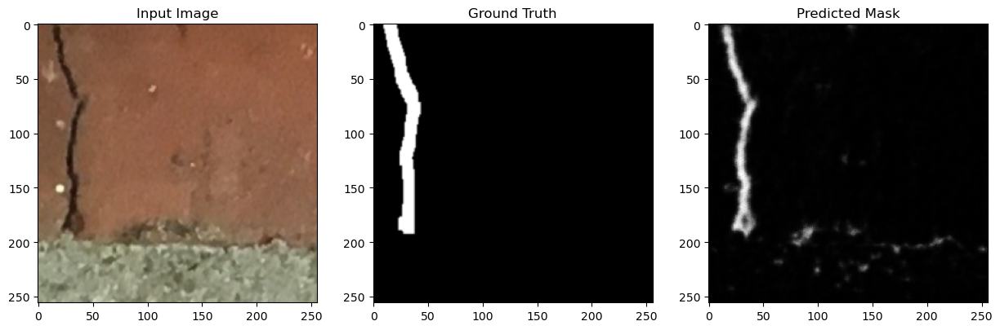

IoU: 0.9665


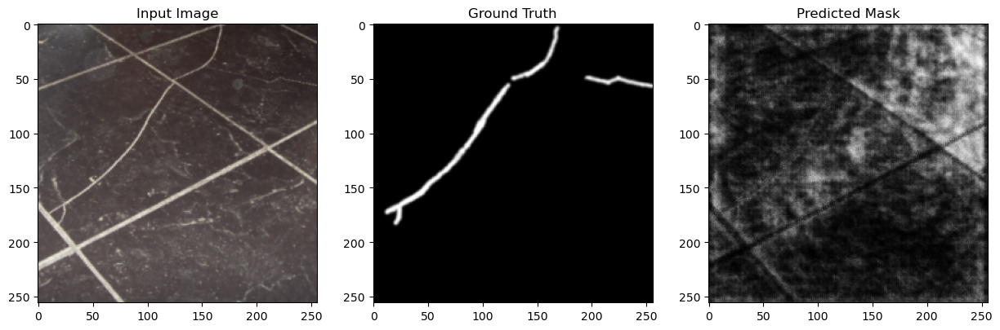

In [29]:
visualize_results(model_segnet, test_loader)